In [1]:
import tables
import numpy as np
import pandas as pd
from collections import Counter

path = "mitosis_ps_labels.pytable"

PS_LABELS = {
    0: "Not mitosis",
    1: "Mitosis",
    2: "Not sure",
    3: "Mitosis elsewhere",
    4: "Garbage",
}

TISSUE = {
    b"BN": "Brain",
    b"BT": "Breast",
    "BN": "Brain",
    "BT": "Breast",
}

SCANNER = {
    b"L": "Leica",
    b"P": "3DHistech",
    "L": "Leica",
    "P": "3DHistech",
}

with tables.open_file(path, "r") as f:
    ps = f.root.ps_label[:]
    tissue = f.root.tissue[:]
    scanner = f.root.scanner[:]

df = pd.DataFrame({
    "ps_label": ps,
    "ps_label_name": [PS_LABELS[int(x)] for x in ps],
    "tissue": [TISSUE[x] for x in tissue],
    "scanner": [SCANNER[x] for x in scanner],
})

# ---- high-level summaries ----
print("\nOverall label distribution:")
print(df["ps_label_name"].value_counts(normalize=True))

print("\nLabel × Tissue:")
print(pd.crosstab(df.ps_label_name, df.tissue, normalize="columns"))

print("\nLabel × Scanner:")
print(pd.crosstab(df.ps_label_name, df.scanner, normalize="columns"))

print("\nLabel × Tissue × Scanner (counts):")
print(pd.crosstab(
    [df.ps_label_name, df.tissue],
    df.scanner
))



Overall label distribution:
ps_label_name
Not mitosis          0.657311
Mitosis              0.208260
Not sure             0.123904
Mitosis elsewhere    0.005581
Garbage              0.004943
Name: proportion, dtype: float64

Label × Tissue:
tissue                Brain    Breast
ps_label_name                        
Garbage            0.009180  0.000000
Mitosis            0.294936  0.107118
Mitosis elsewhere  0.010364  0.000000
Not mitosis        0.460764  0.886662
Not sure           0.224756  0.006220

Label × Scanner:
scanner            3DHistech     Leica
ps_label_name                         
Garbage             0.006577  0.001847
Mitosis             0.184409  0.253463
Mitosis elsewhere   0.005603  0.005540
Not mitosis         0.683800  0.607110
Not sure            0.119610  0.132041

Label × Tissue × Scanner (counts):
scanner                   3DHistech  Leica
ps_label_name     tissue                  
Garbage           Brain          27      4
Mitosis           Brain         590

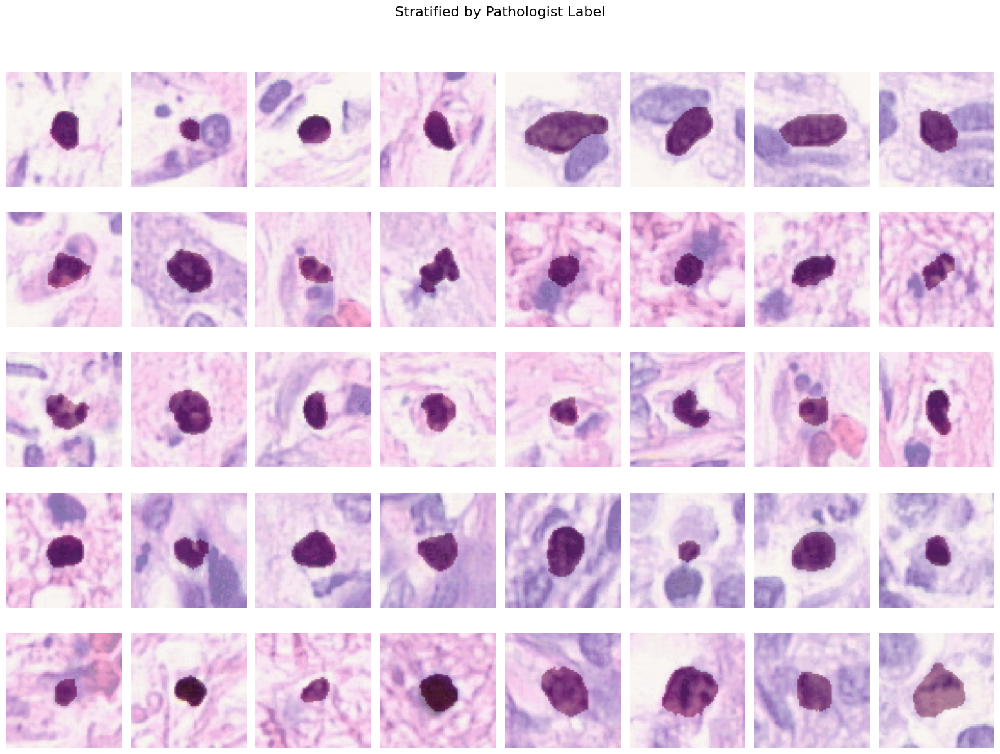

In [7]:
import tables
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

path = "mitosis_ps_labels.pytable"
n_per_row = 8  # images per group

PS_LABELS = {
    0: "Not mitosis",
    1: "Mitosis",
    2: "Not sure",
    3: "Mitosis elsewhere",
    4: "Garbage",
}

TISSUE = {b"BN": "Brain", b"BT": "Breast"}
SCANNER = {b"L": "Leica", b"P": "3DHistech"}

with tables.open_file(path, "r") as f:
    ps = f.root.ps_label
    patch = f.root.patch
    mask = f.root.mask

    selected = defaultdict(list)

    for i in range(ps.shape[0]):
        lbl = int(ps[i])
        if len(selected[lbl]) < n_per_row:
            selected[lbl].append(i)

    labels = sorted(selected.keys())

    fig, axes = plt.subplots(
        len(labels), n_per_row,
        figsize=(2*n_per_row, 2.5*len(labels)),
        squeeze=False
    )

    for r, lbl in enumerate(labels):
        for c, i in enumerate(selected[lbl]):
            ax = axes[r, c]
            ax.imshow(patch[i])
            ax.imshow(mask[i], cmap="Reds", alpha=0.35)
            ax.axis("off")

        axes[r, 0].set_ylabel(
            PS_LABELS[lbl],
            fontsize=12,
            rotation=0,
            labelpad=60,
            va="center"
        )

    fig.suptitle("Stratified by Pathologist Label", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()



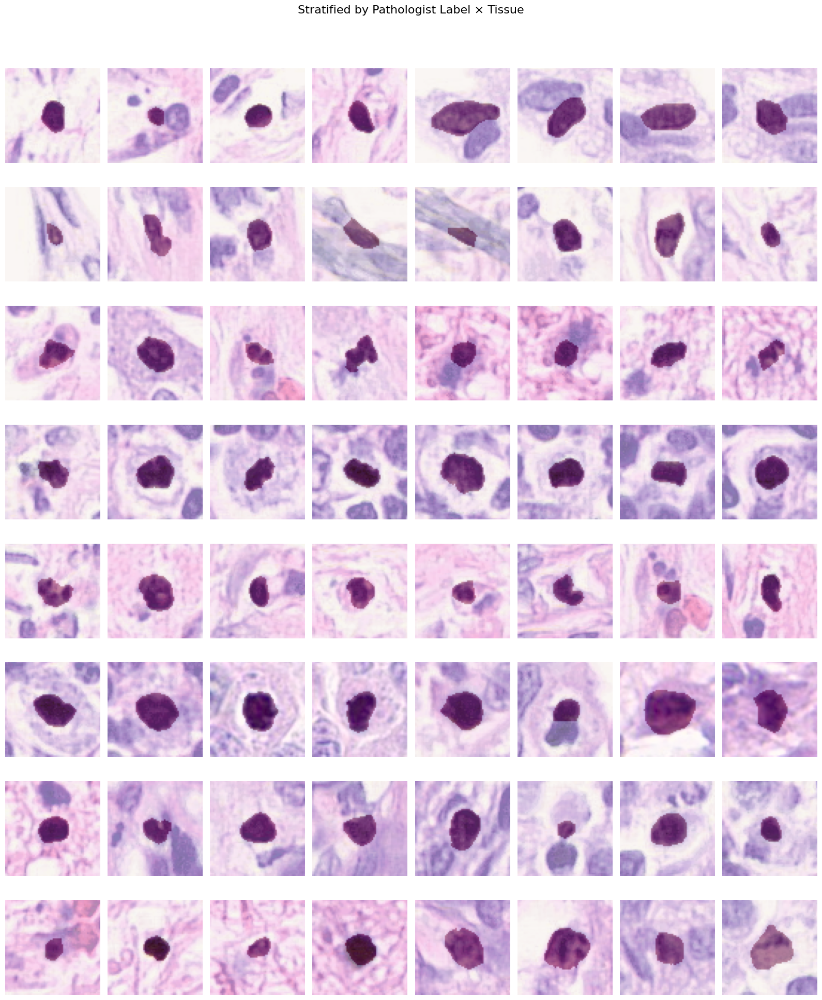

In [8]:
with tables.open_file(path, "r") as f:
    ps = f.root.ps_label
    tissue = f.root.tissue
    patch = f.root.patch
    mask = f.root.mask

    selected = defaultdict(list)

    for i in range(ps.shape[0]):
        key = (int(ps[i]), tissue[i])
        if len(selected[key]) < n_per_row:
            selected[key].append(i)

    groups = sorted(selected.keys())

    fig, axes = plt.subplots(
        len(groups), n_per_row,
        figsize=(2*n_per_row, 2.5*len(groups)),
        squeeze=False
    )

    for r, (lbl, tis) in enumerate(groups):
        for c, i in enumerate(selected[(lbl, tis)]):
            ax = axes[r, c]
            ax.imshow(patch[i])
            ax.imshow(mask[i], cmap="Reds", alpha=0.35)
            ax.axis("off")

        axes[r, 0].set_ylabel(
            f"{PS_LABELS[lbl]}\n{TISSUE[tis]}",
            fontsize=11,
            rotation=0,
            labelpad=70,
            va="center"
        )

    fig.suptitle("Stratified by Pathologist Label × Tissue", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


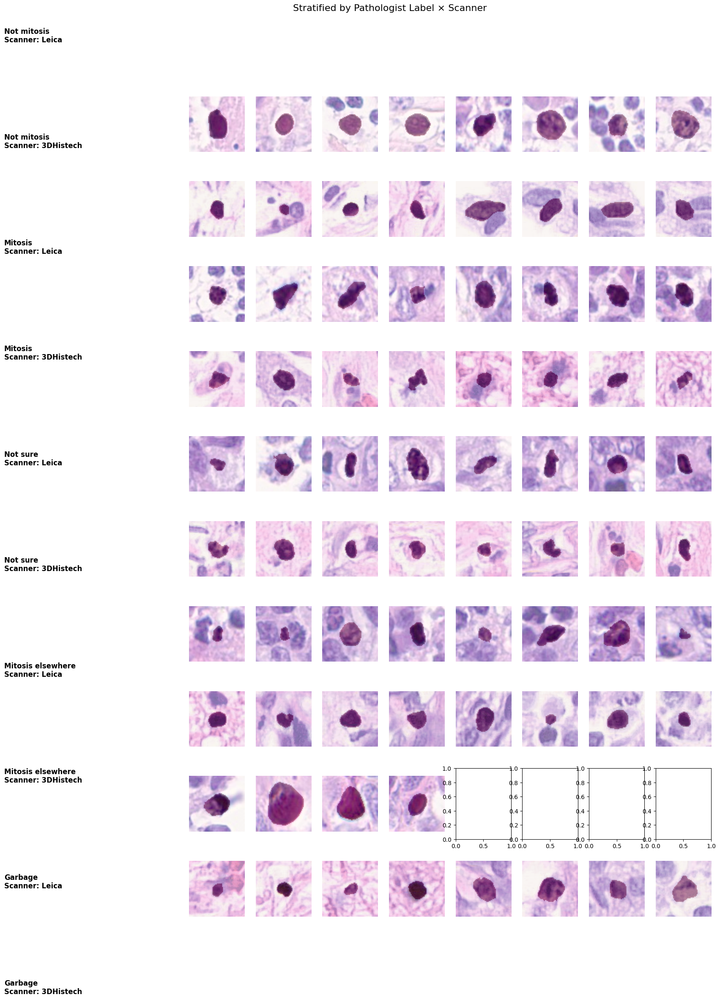

In [10]:
import tables
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

path = "mitosis_ps_labels.pytable"
n_per_row = 8

PS_LABELS = {
    0: "Not mitosis",
    1: "Mitosis",
    2: "Not sure",
    3: "Mitosis elsewhere",
    4: "Garbage",
}

SCANNER = {b"L": "Leica", b"P": "3DHistech"}

with tables.open_file(path, "r") as f:
    ps = f.root.ps_label
    scanner = f.root.scanner
    patch = f.root.patch
    mask = f.root.mask

    selected = defaultdict(list)

    for i in range(ps.shape[0]):
        key = (int(ps[i]), scanner[i])
        if len(selected[key]) < n_per_row:
            selected[key].append(i)

    groups = sorted(selected.keys())

    fig, axes = plt.subplots(
        len(groups),
        n_per_row,
        figsize=(2*n_per_row + 3, 2.5*len(groups)),
        squeeze=False
    )

    # leave space on the left for row labels
    plt.subplots_adjust(left=0.25, top=0.9)

    for r, (lbl, sc) in enumerate(groups):
        for c, i in enumerate(selected[(lbl, sc)]):
            ax = axes[r, c]
            ax.imshow(patch[i])
            ax.imshow(mask[i], cmap="Reds", alpha=0.35)
            ax.axis("off")

        # ---- explicit row label ----
        fig.text(
            0.02,
            1 - (r + 0.5) / len(groups),
            f"{PS_LABELS[lbl]}\nScanner: {SCANNER[sc]}",
            va="center",
            ha="left",
            fontsize=12,
            weight="bold"
        )

    fig.suptitle(
        "Stratified by Pathologist Label × Scanner",
        fontsize=16,
        y=0.98
    )

    plt.show()


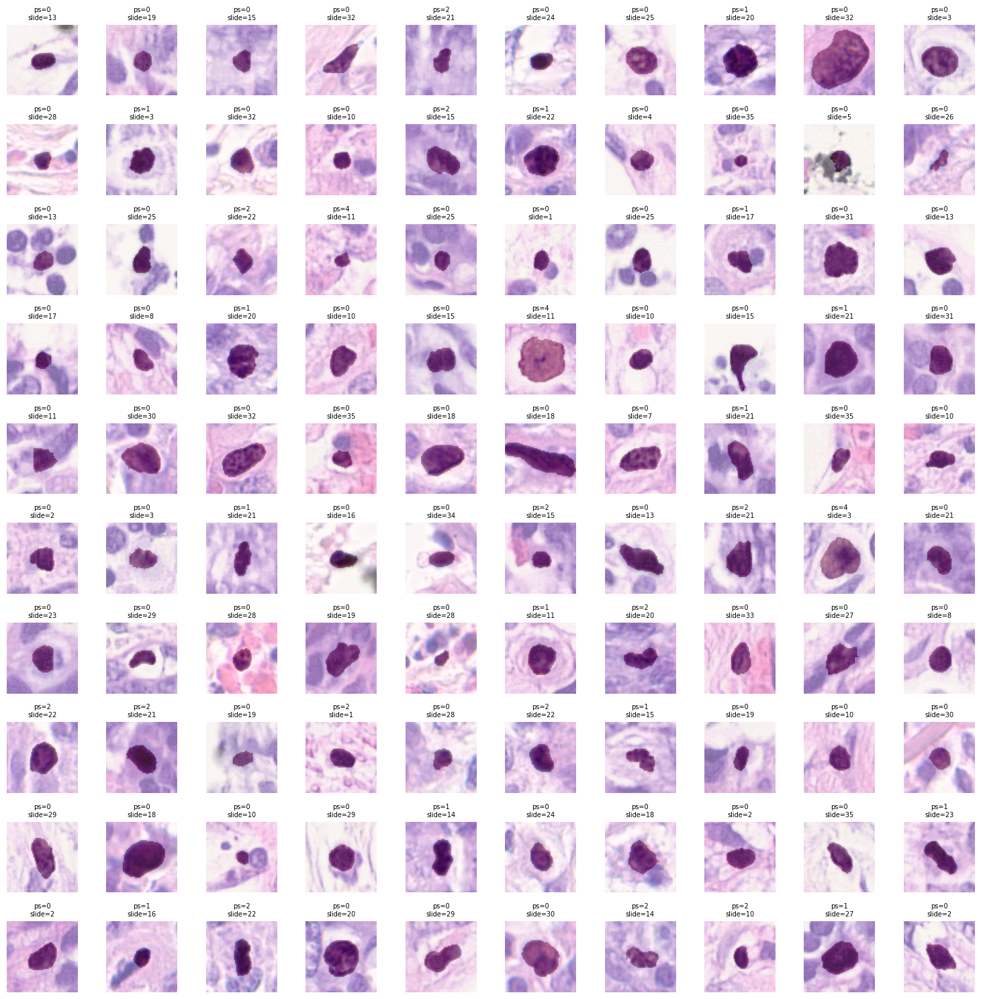

In [2]:
import tables
import numpy as np
import matplotlib.pyplot as plt

path = "mitosis_ps_labels.pytable"
n_samples = 100
grid = 10

with tables.open_file(path, mode="r") as f:
    patch = f.root.patch
    mask = f.root.mask
    ps_label = f.root.ps_label
    slide_id = f.root.slide_id

    n = patch.shape[0]
    idx = np.random.choice(n, size=n_samples, replace=False)

    fig, axes = plt.subplots(grid, grid, figsize=(15, 15))
    axes = axes.ravel()

    for ax, i in zip(axes, idx):
        # Lazy reads: single index at a time
        img = patch[i]          # (64, 64, 3)
        m = mask[i]             # (64, 64)
        label = ps_label[i]
        slide = slide_id[i]

        ax.imshow(img)
        ax.imshow(m, cmap="Reds", alpha=0.35)
        ax.set_title(f"ps={int(label)}\nslide={slide}", fontsize=7)
        ax.axis("off")

plt.tight_layout()
plt.show()
